In [ ]:
!nvidia-smi

Mon Apr 25 05:41:51 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#C1

# clone Scaled_YOLOv4
!git clone https://github.com/roboflow-ai/ScaledYOLOv4.git  # clone repo
%cd /content/ScaledYOLOv4/
#checkout the yolov4-large branch
!git checkout yolov4-large

Cloning into 'ScaledYOLOv4'...
remote: Enumerating objects: 128, done.
remote: Total 128 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving objects: 100% (128/128), 389.37 KiB | 13.43 MiB/s, done.
Resolving deltas: 100% (39/39), done.
/content/ScaledYOLOv4
Branch 'yolov4-large' set up to track remote branch 'yolov4-large' from 'origin'.
Switched to a new branch 'yolov4-large'


In [ ]:
#C2

import torch
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
#C3
%cd /content/
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!python setup.py build install

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 13.05 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda
/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_c

In [ ]:
#C4

!pip install -U PyYAML

     |████████████████████████████████| 596 kB 8.9 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
%cd /content/ScaledYOLOv4/


[Errno 2] No such file or directory: '/content/ScaledYOLOv4/'
/content




![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-scaled-yolov4")

     |████████████████████████████████| 145 kB 9.8 MB/s 
     |████████████████████████████████| 178 kB 67.4 MB/s 
     |████████████████████████████████| 1.1 MB 65.7 MB/s 
     |████████████████████████████████| 67 kB 7.0 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 138 kB 73.6 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-scaled-yolov4


In [ ]:
#C5
%cd /content
from roboflow import Roboflow
rf = Roboflow(api_key="bypmPC1MCpauKoT31Qcy")
project = rf.workspace("paras-patil").project("indian-sign-language-dataset")
dataset = project.version(1).download("yolov5")

/content
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Indian-Sign-Language-Dataset-1 in yolov5pytorch:: 100%|██████████| 1504/1504 [00:01<00:00, 1450.66it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- I
- bad
- child
- college
- enjoy
- good
- hearing
- hello
- house
- man
- my
- name
- nice
- 'no'
- please
- school
- sorry
- strong
- thank you
- welcome
- woman
- work
- 'yes'
- you
- yours
nc: 25
train: Indian-Sign-Language-Dataset-1/train/images
val: Indian-Sign-Language-Dataset-1/valid/images


In [ ]:
%cat /content/ScaledYOLOv4/models/yolov4-csp.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [12,16, 19,36, 40,28]  # P3/8
  - [36,75, 76,55, 72,146]  # P4/16
  - [142,110, 192,243, 459,401]  # P5/32

# yolov4-csp backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, Bottleneck, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 2, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 8, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 8, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]], # 9-P5/32
   [-1, 4, BottleneckCSP, [1024]],  # 10
  ]

# yolov4-csp head
# na = len(anchors[0])
head:
  [[-1, 1, SPPCSP, [512]], # 11
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [8, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1, Concat, [1]],
   [-1, 2, Bott

In [ ]:
# train scaled-YOLOv4 on custom data for 100 epochs
# time its performance
%%time
%cd /content/ScaledYOLOv4/
!python train.py --img 416 --batch 16 --epochs 1200 --data {dataset.location}/data.yaml --cfg ./models/yolov4-csp.yaml --weights '' --name yolov4-csp-results  --cache

/content/ScaledYOLOv4
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov4-csp.yaml', data='/content/Indian-Sign-Language-Dataset-1/data.yaml', device='', epochs=1200, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov4-csp-results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='', world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.5, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flip

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
#from utils.general import plot_results  # plot results.txt as results.png
from IPython.display import Image, display
display(Image('/content/ScaledYOLOv4/runs/exp8_yolov4-csp-results/results.png'))  # view results.png

GROUND TRUTH TRAINING DATA:


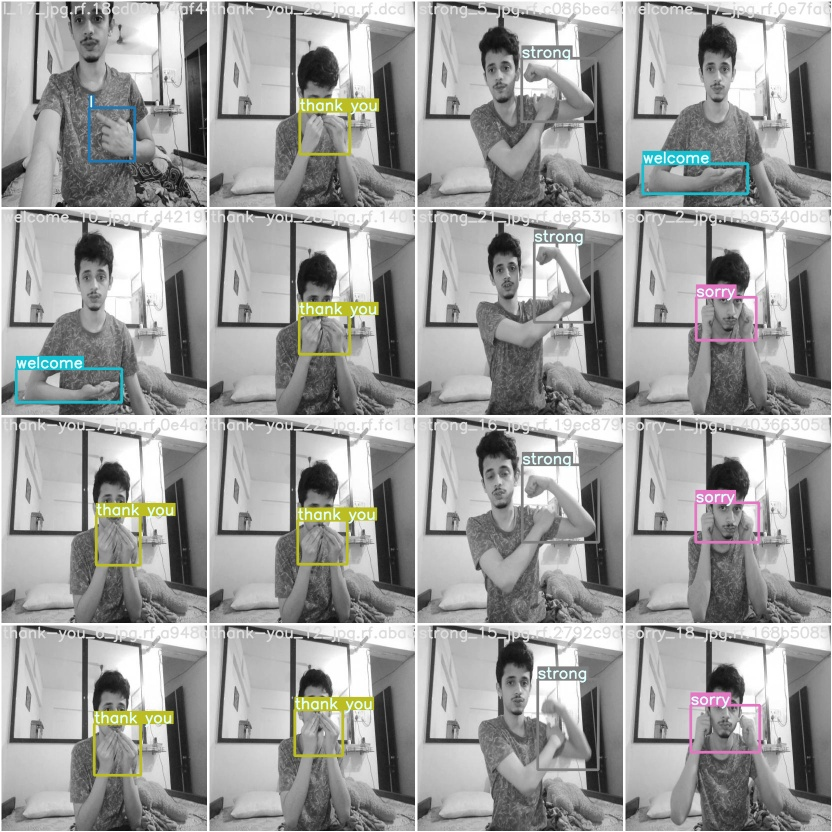

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/exp8_yolov4-csp-results/test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


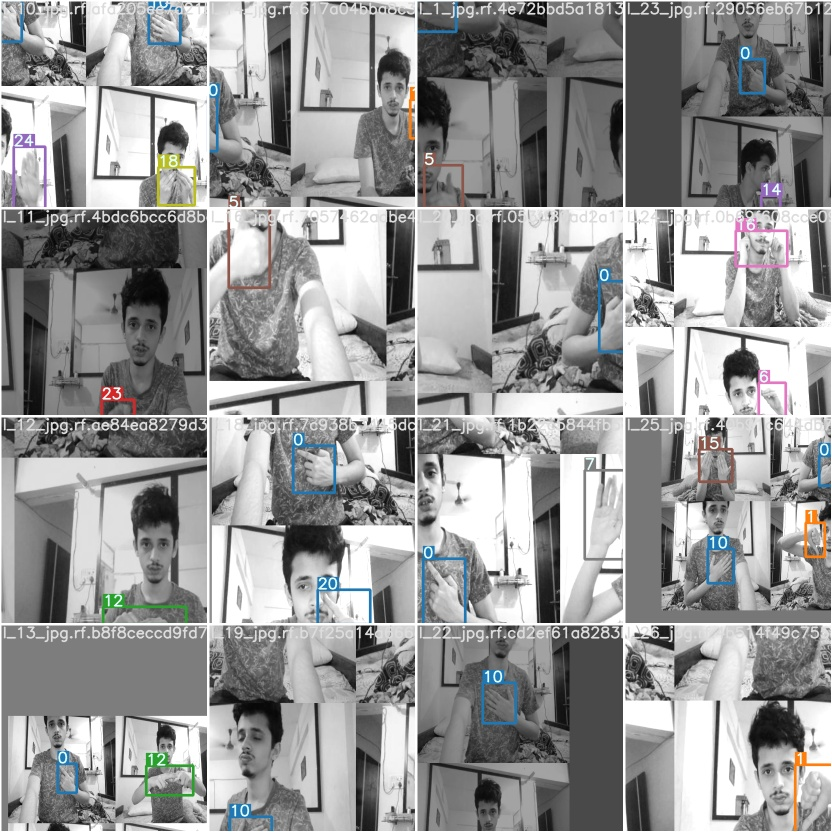

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/exp8_yolov4-csp-results/train_batch0.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov4-csp-results/  exp3_yolov4-csp-results/  exp6_yolov4-csp-results/
exp1_yolov4-csp-results/  exp4_yolov4-csp-results/  exp7_yolov4-csp-results/
exp2_yolov4-csp-results/  exp5_yolov4-csp-results/  exp8_yolov4-csp-results/


In [ ]:
%ls ./runs/exp8_yolov4-csp-results/weights

best.pt  last.pt


In [ ]:


# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/ScaledYOLOv4/
!python detect.py --weights ./runs/exp8_yolov4-csp-results/weights/best.pt --img 416 --conf 0.4 --source /content/yolo_video.mp4

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/yolo_video.mp4', update=False, view_img=False, weights=['./runs/exp8_yolov4-csp-results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

Traceback (most recent call last):
  File "detect.py", line 171, in <module>
    detect()
  File "detect.py", line 33, in detect
    model = attempt_load(weights, map_location=device)  # load FP32 model
  File "/content/ScaledYOLOv4/models/experimental.py", line 136, in attempt_load
    attempt_download(w)
  File "/content/ScaledYOLOv4/utils/google_utils.py", line 33, in attempt_download
    raise Exception(msg)
Exception: ./runs/exp8_yolov4-csp-results/weights/best.pt missing


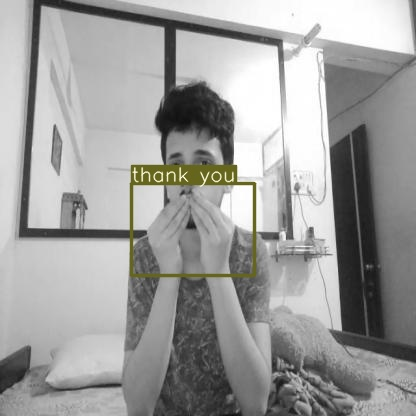

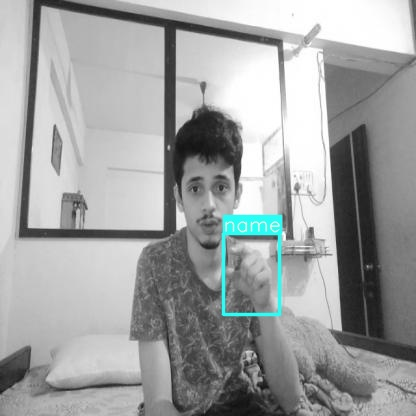

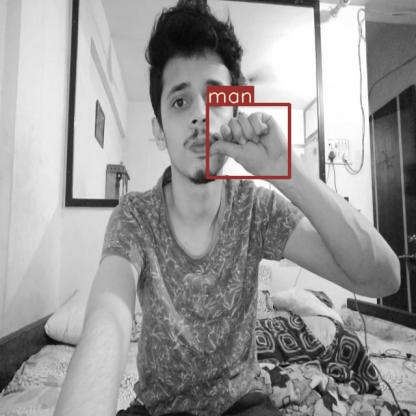

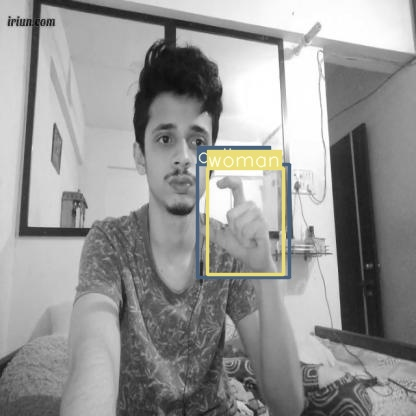

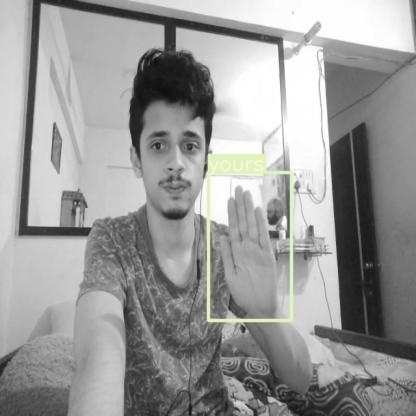

...

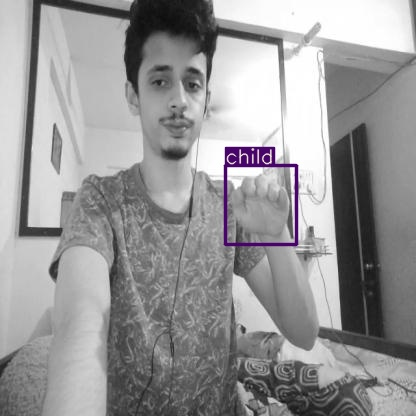

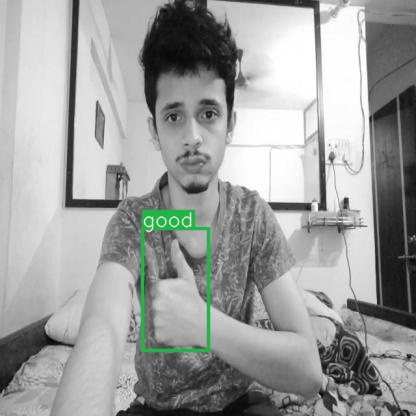

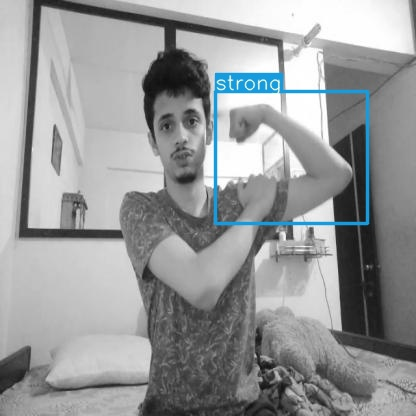

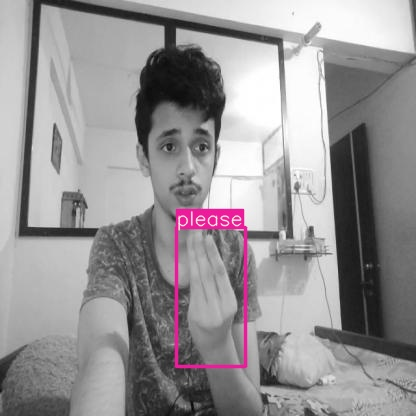

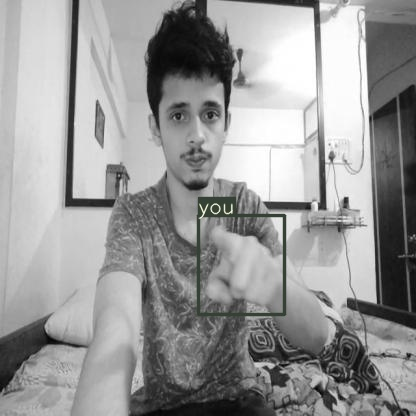

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

for imageName in glob.glob('./inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import files
files.download('./runs/exp8_yolov4-csp-results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r /content/ScaledYOLOv4.zip /content/ScaledYOLOv4

  adding: content/ScaledYOLOv4/ (stored 0%)
  adding: content/ScaledYOLOv4/detect.py (deflated 64%)
  adding: content/ScaledYOLOv4/utils/ (stored 0%)
  adding: content/ScaledYOLOv4/utils/general.py (deflated 68%)
  adding: content/ScaledYOLOv4/utils/google_utils.py (deflated 64%)
  adding: content/ScaledYOLOv4/utils/torch_utils.py (deflated 60%)
  adding: content/ScaledYOLOv4/utils/__init__.py (stored 0%)
  adding: content/ScaledYOLOv4/utils/datasets.py (deflated 70%)
  adding: content/ScaledYOLOv4/utils/activations.py (deflated 72%)
  adding: content/ScaledYOLOv4/.git/ (stored 0%)
  adding: content/ScaledYOLOv4/.git/config (deflated 41%)
  adding: content/ScaledYOLOv4/.git/HEAD (stored 0%)
  adding: content/ScaledYOLOv4/.git/logs/ (stored 0%)
  adding: content/ScaledYOLOv4/.git/logs/HEAD (deflated 44%)
  adding: content/ScaledYOLOv4/.git/logs/refs/ (stored 0%)
  adding: content/ScaledYOLOv4/.git/logs/refs/remotes/ (stored 0%)
  adding: content/ScaledYOLOv4/.git/logs/refs/remotes/origi

In [ ]:
from google.colab import files
files.download("/content/ScaledYOLOv4.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#C6

#mount drive
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive

# list the contents of /mydrive
!ls /mydrive

#Navigate to /mydrive/yolov4
# %cd /mydrive

/
Mounted at /content/gdrive
'3rd Year_Paras Patil_CMPN_D12B_46.gdoc'
'46_Paras Patil_D12B_Assignment File (PCE-2).gdoc'
'AI Proposal.gdoc'
'BCE A4.gdoc'
'Birthday 2022'
 Budget.gdoc
'Colab Notebooks'
'Copy of best.pt'
'Copy of Mental Health Infographics by Slidesgo (1).gslides'
'Copy of Mental Health Infographics by Slidesgo (2).gslides'
'Copy of Mental Health Infographics by Slidesgo.gslides'
'Copy of Pastel Portfolio | by Slidesgo.gslides'
'Copy of Roadmap Infographics by Slidesgo.gslides'
'Copy of Technology Infographics by Slidesgo.gslides'
'Copy of Tech Startup | by Slidesgo.gslides'
'Copy of Tourism in Italy: Dolomites MK Campaign by Slidesgo.gslides'
'Cover Letter.gdoc'
 CSS_Case_Study.gslides
'Do violent video games encourage violence.docx'
'DWM Exp 10 Report (1).gdoc'
'DWM Presentation.gslides'
'Exoplanet Detection.gdoc'
 Explanation.gdoc
 Firebase.gslides
 Flutter.gdoc
'Getting started.pdf'
 GPU.ipynb
'Group No. 6 BCE Proposal.gdoc'
'Group No. 6 BCE Proposal.pdf'
'Imp Progra

In [ ]:


!ls /mydrive

'3rd Year_Paras Patil_CMPN_D12B_46.gdoc'
'46_Paras Patil_D12B_Assignment File (PCE-2).gdoc'
'AI Proposal.gdoc'
'BCE A4.gdoc'
'Birthday 2022'
 Budget.gdoc
'Colab Notebooks'
'Copy of best.pt'
'Copy of Mental Health Infographics by Slidesgo (1).gslides'
'Copy of Mental Health Infographics by Slidesgo (2).gslides'
'Copy of Mental Health Infographics by Slidesgo.gslides'
'Copy of Pastel Portfolio | by Slidesgo.gslides'
'Copy of Roadmap Infographics by Slidesgo.gslides'
'Copy of Technology Infographics by Slidesgo.gslides'
'Copy of Tech Startup | by Slidesgo.gslides'
'Copy of Tourism in Italy: Dolomites MK Campaign by Slidesgo.gslides'
'Cover Letter.gdoc'
 CSS_Case_Study.gslides
'Do violent video games encourage violence.docx'
'DWM Exp 10 Report (1).gdoc'
'DWM Presentation.gslides'
'Exoplanet Detection.gdoc'
 Explanation.gdoc
 Firebase.gslides
 Flutter.gdoc
'Getting started.pdf'
 GPU.ipynb
'Group No. 6 BCE Proposal.gdoc'
'Group No. 6 BCE Proposal.pdf'
'Imp Programs.gdoc'
'INT001: Logbook.gsh

In [ ]:
#C7

%cd /content/ScaledYOLOv4/
!python detect.py --weights /content/gdrive/MyDrive/yolov4/best.pt --img 416 --conf 0.4 --source /content/Indian-Sign-Language-Dataset-1/test/images

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/Indian-Sign-Language-Dataset-1/test/images', update=False, view_img=False, weights=['/content/gdrive/MyDrive/yolov4/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Fusing layers... Model Summary: 235 layers, 5.25998e+07 parameters, 5.04494e+07 gradients
image 1/74 /content/Indian-Sign-Language-Dataset-1/test/images/I_15_jpg.rf.e03550f381f40ce9834d440fd19fb7b1.jpg: 416x416 1 Is, Done. (0.036s)
image 2/74 /content/Indian-Sign-Language-Dataset-1/test/images/I_2_jpg.rf.1d6f4afe605e7de2efe784f230920d69.jpg: 416x416 1 Is, Done. (0.023s)
image 3/74 /content/Indian-Sign-Language-Dataset-1/test/images/bad_13_jpg.rf.cc96f6d0873dc4324092f3399308e8c0.jpg: 416x416 1 bads, Done. (0.023s)
image 4/74 /content/Indian-Sign-Language-Dataset-1/test/images/bad_24_jpg.rf

In [ ]:
#C7

%cd /content/ScaledYOLOv4/
!python detect.py --weights /content/gdrive/MyDrive/yolov4/best.pt --img 416 --conf 0.4 --source /content/video.mp4

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/video.mp4', update=False, view_img=False, weights=['/content/gdrive/MyDrive/yolov4/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Fusing layers... Model Summary: 235 layers, 5.25998e+07 parameters, 5.04494e+07 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
video 1/1 (1/212) /content/video.mp4: 288x416 Done. (0.046s)
video 1/1 (2/212) /content/video.mp4: 288x416 Done. (0.021s)
video 1/1 (3/212) /content/video.mp4: 288x416 Done. (0.021s)
video 1/1 (4/212) /content/video.mp4: 288x4